## FRB130729

FRB verification criteria.

Criteria results:

* POSTIVE: good evidence for astrophysical origin
* NEUTRAL: neutral evidence
* UNKNOWN: unknown from reported data
* NEGATIVE: evidence for terrestrial origin (non-critical)
* CRITICAL: good evidence for terrestiral origin (critical)
* NOTVALID: not valid criterion for observation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import lmfit
import cPickle as pkl

import astropy.time
import astropy.coordinates
import astropy.units

import dedispersion
import filterbankio
import frbutils
import scatterutils

%matplotlib inline

In [2]:
sns.set()
sns.set_context("notebook", rc={"lines.linewidth": 1.0})

In [3]:
criteria = {} # criteria status dictionary

### Parameters

[Five new Fast Radio Bursts from the HTRU high latitude survey: first evidence for two-component bursts - Champion et al.](https://arxiv.org/abs/1511.07746)

[Data Link](https://data-portal.hpc.swin.edu.au/dataset/fast-radio-burst-data-high-time-resolution-universe-survey-high-latitude)

Data Extraction:

```
boltflash:
cd /data2/griffin/FRB130729/10
header 2013-07-29-09\:01\:05.fil
extract 2013-07-29-09\:01\:05.fil 640625 156250 > FRB130729_s41r10.fil
decimate -c 1 -t 1 -n 8 FRB130729_s41r10.fil > FRB130729_s41r10b8.fil
```

In [4]:
frbStr = 'FRB130729'
frbFil = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8.fil' # Filterbank file of FRB event (watermark)

### Dynamic Spectrum (Component Optimized)

In [5]:
### dynamic spectrum parameters
timeFactor = 1 # time decimation factor
freqFactor = 1 # frequency decimation factor
dm = 851.5 # dedispersion

start_time = 5.1 # seconds
time_window = 0.2 # seconds

applyGauss = True # apply a Gaussian filter to the dynamic specturm
fGauss = 4. # frequency bins
tGauss = 8. # time bins

rfi = [[45,65], [155,175], [200,250], [850,1023]] # frequency channels to flag as rfi, pairs are the edges of bands

In [6]:
decwaterfall, decddwaterfall, tInt, freqs = frbutils.dynamicSpectrum(frbFil, start_time, time_window,
                                                timeFactor=timeFactor, freqFactor=freqFactor,
                                                dm=dm,
                                                applyGauss=applyGauss, fGauss=fGauss, tGauss=tGauss,
                                                rfi=rfi)

#### DM Excess

Using https://www.nrl.navy.mil/rsd/RORF/ne2001/

Galactic pointing: (l, b) = (324.788, 54.7446)

In [7]:
DM_galaxy = 31.0
DM_excess = dm / DM_galaxy
print 'DM Excess fraction:', DM_excess

DM Excess fraction: 27.4677419355


In [8]:
criteria['DMexcess'] = 'POSITIVE'

#### TIme Series

In [9]:
ddTimeSeries = np.mean(decddwaterfall, axis=1)

#### Stokes I Plot

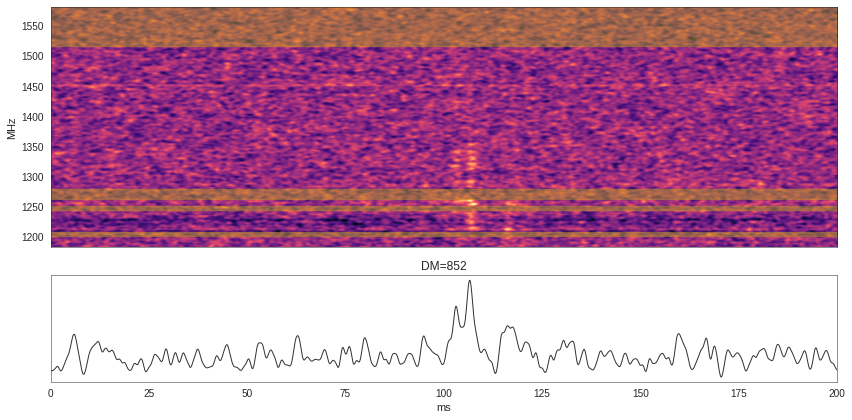

In [10]:
cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=3, rowspan=2)

imRaw = plt.imshow(np.flipud(decddwaterfall.T), extent=(0, tInt*decddwaterfall.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')
# crop out RFI flagged high freqs
#imRaw = plt.imshow(np.flipud(decddwaterfall[:,:850].T), extent=(0, tInt*decddwaterfall.shape[0],\
#                        freqs[0], freqs[850]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')
for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')

ax1.get_xaxis().set_visible(False)

ax2 = plt.subplot2grid((3, 3), (2, 0), colspan=3)
lineColor = 'k'
plt.plot(1000.*tInt*np.arange(decddwaterfall.shape[0]), ddTimeSeries, lineColor, alpha=0.8)
plt.xlim(0, 1000.*tInt*ddTimeSeries.shape[0])
plt.title('DM=%0.f'%dm)
plt.xlabel('ms')
ax2.get_yaxis().set_visible(False)

plt.tight_layout()
plt.savefig('%s_dynamic.png'%frbStr)

#### Signal to Noise

In [13]:
SNR = (ddTimeSeries.max() - ddTimeSeries.mean()) / ddTimeSeries.std()
print 'S/N:', SNR
criteria['SNR'] = 'POSITIVE'

S/N: 6.171127897


#### Boresight Flux

In [14]:
SEFD = 30. # Jy, approximate SEFD of Parkes L-band
flux = frbutils.flux(SEFD, SNR, 1, 2, tInt, (freqs[-1]-freqs[0])*1e6)
print 'flux: %f Jy'%flux
criteria['flux'] = 'POSITIVE'

flux: 0.818583 Jy


#### Components

[[Model]]
    ((Model(constant) + Model(gaussian, prefix='nc0')) + Model(gaussian, prefix='nc1'))
[[Fit Statistics]]
    # function evals   = 230
    # data points      = 1000
    # variables        = 7
    chi-square         = 2312.126
    reduced chi-square = 2.328
    Akaike info crit   = 852.167
    Bayesian info crit = 886.522
[[Variables]]
    c:              297.625812 +/- 0        (0.00%) (init= 0)
    nc0sigma:       2.25980511 +/- 0        (0.00%) (init= 1)
    nc0center:      28.8395082 +/- 0        (0.00%) (init= 0)
    nc0amplitude:   39.7871916 +/- 0        (0.00%) (init= 1)
    nc1sigma:       3.11240659 +/- 0        (0.00%) (init= 1)
    nc1center:      87.4724181 +/- 0        (0.00%) (init= 0)
    nc1amplitude:  -235.570282 +/- 0        (0.00%) (init= 1)
    nc0fwhm:        5.32143427 +/- 0        (0.00%)  == '2.3548200*nc0sigma'
    nc0height:      7.02396576 +/- 0        (0.00%)  == '0.3989423*nc0amplitude/max(1.e-15, nc0sigma)'
    nc1fwhm:        7.32915728 +/- 0  

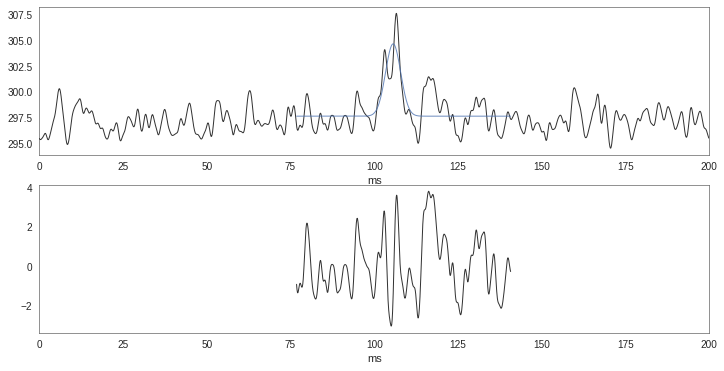

In [15]:
# Assume pulse can be modelled as a set of Gaussian components on a constant offset
nComponents = 2 # number of components in pulse

pulseModel = lmfit.models.ConstantModel()
for nc in np.arange(nComponents):
    gaussComp = lmfit.models.GaussianModel(prefix='nc%i'%nc)
    pulseModel += gaussComp

#print pulseModel
params = pulseModel.make_params()

#select only region around pulse for fit
tIdx0 = 1200
tIdx1 = 2200
ddTimeSeriesCent = ddTimeSeries[tIdx0:tIdx1]
result = pulseModel.fit(ddTimeSeriesCent, params, x=1000.*tInt*np.arange(ddTimeSeriesCent.shape[0]))
print result.fit_report()

fig = plt.figure(figsize=(12,6)) # (width, height)

ax1 = plt.subplot(2,1,1)
lineColor = 'k'
plt.plot(1000.*tInt*np.arange(ddTimeSeries.shape[0]), ddTimeSeries, lineColor, alpha=0.8)
plt.plot(1000.*tInt*(np.arange(ddTimeSeriesCent.shape[0])+tIdx0), result.best_fit, alpha=0.8)
plt.xlim(0, 1000.*tInt*ddTimeSeries.shape[0])
plt.xlabel('ms')

ax2 = plt.subplot(2,1,2)
lineColor = 'k'
plt.plot(1000.*tInt*(np.arange(ddTimeSeriesCent.shape[0])+tIdx0), ddTimeSeriesCent - result.best_fit,\
         lineColor, alpha=0.8)
plt.xlim(0, 1000.*tInt*ddTimeSeries.shape[0])
plt.xlabel('ms')

print 'NCOMPONENTS:', nComponents
for nc in np.arange(nComponents):
    print 'FWHM%i (ms):'%nc, result.params['nc%ifwhm'%nc].value

In [16]:
criteria['pulsewidth'] = 'POSITIVE' # reasonable pulse width
criteria['multicomp'] = 'NEUTRAL' # two components

### Polarization

In [17]:
criteria['polarization'] = 'NOTVALID' # not recorded

### Spectral Index

In [18]:
# upper and lower frequency of pulse
# if pulse goes to the edge of beam, set to None
upperFreqMHz = 1355.
lowerFreqMHz = 1205.
obsFracBand = (freqs[-1]-freqs[0]) / ((freqs[-1]+freqs[0])/2.) # observational fractional bandwidth
print 'START OBS FREQ (MHz):', freqs[0]
print 'STOP OBS FREQ (MHz):', freqs[-1]
print 'BANDWIDTH (MHz):', freqs[-1]-freqs[0]
print 'FRACTIONAL OBS BANDWIDTH:', obsFracBand
print 'FRACTIONAL PULSE BANDWIDTH:', (upperFreqMHz - lowerFreqMHz) / ((upperFreqMHz+lowerFreqMHz)/2.)

criteria['broadband'] = 'NEGATIVE'

START OBS FREQ (MHz): 1182.1953125
STOP OBS FREQ (MHz): 1581.8046875
BANDWIDTH (MHz): 399.609375
FRACTIONAL OBS BANDWIDTH: 0.289152948625
FRACTIONAL PULSE BANDWIDTH: 0.1171875


In [19]:
# region to use for spectral index fit

# select between freq limits
upperFreqIdx = np.argmin(np.abs(freqs - upperFreqMHz))
lowerFreqIdx = np.argmin(np.abs(freqs - lowerFreqMHz))

# select around peak
peakIdx = np.unravel_index(np.argmax(decddwaterfall), decddwaterfall.shape)
tWidth = 5 # number of time stample to take on eiter side of peak

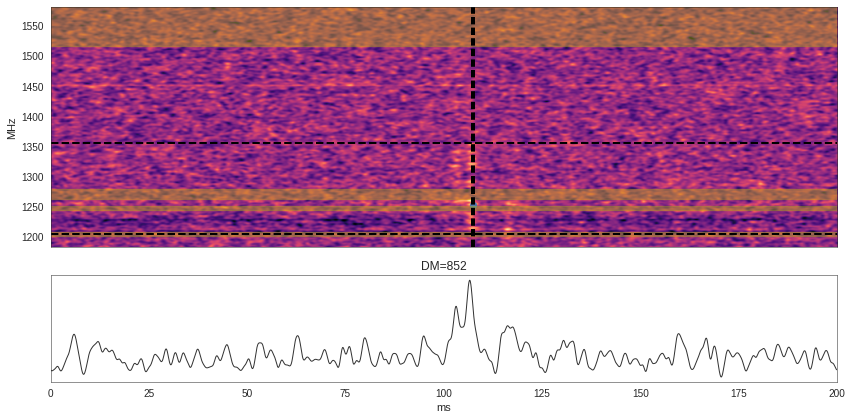

In [20]:
cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=3, rowspan=2)

imRaw = plt.imshow(np.flipud(decddwaterfall.T), extent=(0, tInt*decddwaterfall.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')
# crop out RFI flagged high freqs
#imRaw = plt.imshow(np.flipud(decddwaterfall[:,:850].T), extent=(0, tInt*decddwaterfall.shape[0],\
#                        freqs[0], freqs[850]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')
plt.axhline(y=upperFreqMHz, c='k', lw=2, ls='--')
plt.axhline(y=lowerFreqMHz, c='k', lw=2, ls='--')
plt.scatter(tInt*peakIdx[0], freqs[peakIdx[1]])
plt.axvline(x=tInt*(peakIdx[0]-tWidth), c='k', lw=2, ls='--')
plt.axvline(x=tInt*(peakIdx[0]+tWidth), c='k', lw=2, ls='--')

ax1.get_xaxis().set_visible(False)

ax2 = plt.subplot2grid((3, 3), (2, 0), colspan=3)
lineColor = 'k'
plt.plot(1000.*tInt*np.arange(decddwaterfall.shape[0]), ddTimeSeries, lineColor, alpha=0.8)
plt.xlim(0, 1000.*tInt*ddTimeSeries.shape[0])
plt.title('DM=%0.f'%dm)
plt.xlabel('ms')
ax2.get_yaxis().set_visible(False)

plt.tight_layout()

[[Model]]
    (Model(constant) + Model(powerlaw))
[[Fit Statistics]]
    # function evals   = 61
    # data points      = 307
    # variables        = 3
    chi-square         = 62388.704
    reduced chi-square = 205.226
    Akaike info crit   = 1637.488
    Bayesian info crit = 1648.668
[[Variables]]
    c:           436.763027 +/- 7.25e+03 (1661.07%) (init= 0)
    exponent:    0.47779272 +/- 29.77993 (6232.81%) (init= 1)
    amplitude:  -0.00519211 +/- 3.543527 (68248.27%) (init= 1)
[[Correlations]] (unreported correlations are <  0.100)
    C(exponent, amplitude)       =  1.000 
    C(c, amplitude)              = -1.000 
    C(c, exponent)               = -1.000 

SPECTRAL INDEX: 0.477792726333


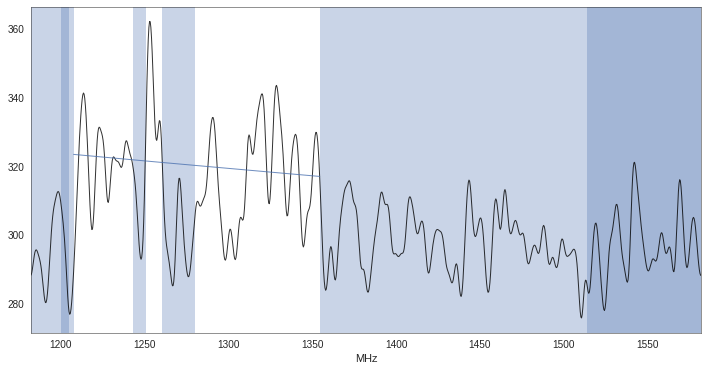

In [21]:
spectralRaw = decddwaterfall[peakIdx[0]-tWidth:peakIdx[0]+tWidth].mean(axis=0)

vaildFreqMask = np.zeros_like(spectralRaw)
vaildFreqMask[lowerFreqIdx:upperFreqIdx] = 1.
for freqPair in rfi:
    vaildFreqMask[freqPair[0]:freqPair[1]] = 0.

spectralModel = lmfit.models.ConstantModel() + lmfit.models.PowerLawModel()
spectralParams = spectralModel.make_params()
spectralResult = spectralModel.fit(spectralRaw[vaildFreqMask.astype(bool)],\
                                   spectralParams, x=freqs[vaildFreqMask.astype(bool)]*1e6)
print spectralResult.fit_report()

fig = plt.figure(figsize=(12,6)) # (width, height)

lineColor = 'k'
plt.plot(freqs, spectralRaw, lineColor, alpha=0.8)
plt.plot(freqs[vaildFreqMask.astype(bool)], spectralResult.best_fit, alpha=0.8)

plt.axvspan(freqs[0], freqs[lowerFreqIdx], alpha=0.3)
plt.axvspan(freqs[upperFreqIdx], freqs[-1], alpha=0.3)
for freqPair in rfi:
    plt.axvspan(freqs[freqPair[0]/freqFactor], freqs[freqPair[1]/freqFactor], alpha=0.3)

plt.xlabel('MHz')
plt.xlim(freqs[0], freqs[-1])

print 'SPECTRAL INDEX:', spectralResult.params['exponent'].value

In [22]:
criteria['spectralIndex'] = 'NEGATIVE' # because the pulse is band limited but the spectral index is ~flat

### High-resolution Structure

In [23]:
### dynamic spectrum parameters
timeFactor = 1 # time decimation factor
freqFactor = 1 # frequency decimation factor
dm = 851.5 # dedispersion

start_time = 5.1 # seconds
time_window = 0.2 # seconds

applyGauss = True # apply a Gaussian filter to the dynamic specturm
fGauss = 2. # frequency bins
tGauss = 1. # time bins

rfi = [[45,65], [155,175], [200,250], [850,1023]] # frequency channels to flag as rfi, pairs are the edges of bands

In [24]:
decwaterfall, decddwaterfall, tInt, freqs = frbutils.dynamicSpectrum(frbFil, start_time, time_window,
                                                timeFactor=timeFactor, freqFactor=freqFactor,
                                                dm=dm,
                                                applyGauss=applyGauss, fGauss=fGauss, tGauss=tGauss,
                                                rfi=rfi)

In [25]:
ddTimeSeries = np.mean(decddwaterfall, axis=1)

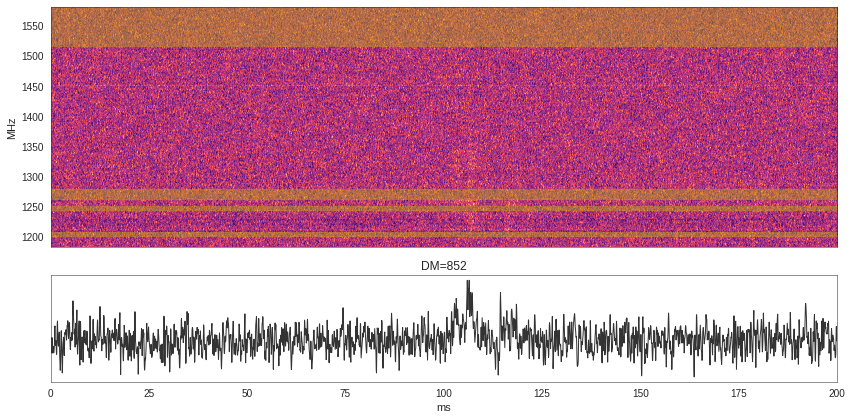

In [26]:
cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=3, rowspan=2)

imRaw = plt.imshow(np.flipud(decddwaterfall.T), extent=(0, tInt*decddwaterfall.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')

ax1.get_xaxis().set_visible(False)

ax2 = plt.subplot2grid((3, 3), (2, 0), colspan=3)
lineColor = 'k'
plt.plot(1000.*tInt*np.arange(decddwaterfall.shape[0]), ddTimeSeries, lineColor, alpha=0.8)
plt.xlim(0, 1000.*tInt*ddTimeSeries.shape[0])
plt.title('DM=%0.f'%dm)
plt.xlabel('ms')
ax2.get_yaxis().set_visible(False)

plt.tight_layout()

In [27]:
criteria['highResStruct'] = 'NEUTRAL' # potentially multiple bandlimited pulses

### Scattering

In [28]:
### Write dynamic spectrum to ascii file using a pdv-like method (writePDVtimeSeries)
### nch determines the number of channels to which a scattering time (tau value) is fitted
pdvfilen = '%s.ascii' %frbFil
pdvfile = scatterutils.writePDVtimeSeries(decddwaterfall, freqs, time_window, nch=4, src='FRB', ofn=pdvfilen) 

Pulsar name: FRB
Number of channels: 4
Number of bins: 3125
RMS: 0.411914
Using Tsub in header to convert bins to time. Note Tsub here is full phase time, corresponding to nbins.

 Channel 0
peak bin at lowest freq channel:1670
Rolling data by --107 bins
[[Model]]
    Model(GxETrain)
[[Fit Statistics]]
    # function evals   = 342
    # data points      = 3125
    # variables        = 5
    chi-square         = 513.606
    reduced chi-square = 0.165
    Akaike info crit   = -5632.918
    Bayesian info crit = -5602.682
[[Variables]]
    mu:      1537.61405 +/- 2.455588 (0.16%) (init= 1563)
    sigma:   8.54942072 +/- 3.225324 (37.73%) (init= 15)
    A:       4.41407606 +/- 1.702446 (38.57%) (init= 1.853215)
    tau:     86.0496118 +/- 12.21756 (14.20%) (init= 200)
    dc:     -0.13337726 +/- 0.007737 (5.80%) (init= 0)
    nbins:   3125 (fixed)
[[Correlations]] (unreported correlations are <  0.100)
    C(sigma, A)                  = -0.973 
    C(A, tau)                    =  0.461 
   

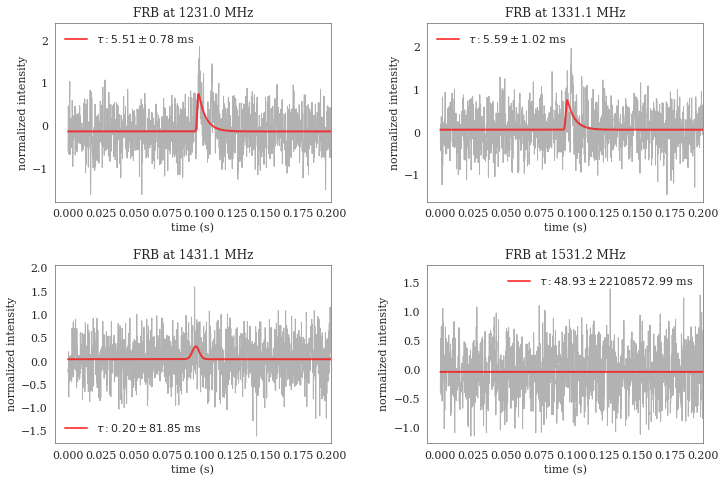

Tau (ms): 5.51
tau1GHz_alpha_4 (ms) ~ 12.65 

Tau (ms): 5.59
tau1GHz_alpha_4 (ms) ~ 17.56 

Tau (ms): 0.20
tau1GHz_alpha_4 (ms) ~ 0.82 

Tau (ms): 48.93
tau1GHz_alpha_4 (ms) ~ 268.97 



In [29]:
### produce_taufits 
### provides lmfit scattering fits (using intrinsic Gaussian shape) for each 'nch'
### method='iso' uses the standard ISM broadening function propto (1/tau)e^(-t/tau)

freqMHz, taus, tauserr = scatterutils.produce_taufits(pdvfilen,meth='iso')

In [30]:
tauserr_nonzero = tauserr[np.nonzero(tauserr)]

In [31]:
taus = taus[np.nonzero(tauserr)]
taus

array([ 0.00550718,  0.00559355,  0.00019539,  0.04893269])

[[Variables]]
    exponent:    0.19909404 +/- 0.001591 (0.80%) (init= 3.861581)
    amplitude:   0.00528396 +/- 1.94e-06 (0.04%) (init= 0.00120596)
[[Correlations]] (unreported correlations are <  0.100)
    C(exponent, amplitude)       = -0.989 


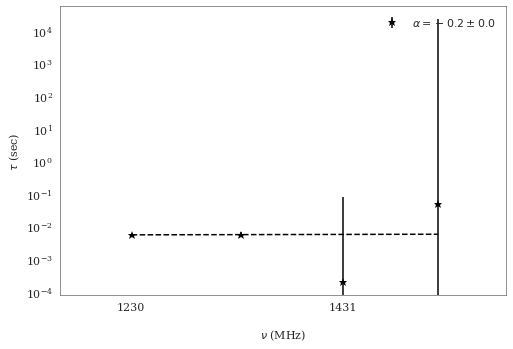

In [32]:
### produce_tauspectrum
### lmfit power law fit (weighted: 1/tauerr^2) for all non-zero tauerr
import scatterutils as scat
alpha, alphaerr = scat.produce_tauspectrum(freqMHz, taus, tauserr)

In [34]:
criteria['scattering'] = 'NEUTRAL' # no fit

### Scintillation

In [35]:
criteria['scintillation'] = 'NEUTRAL' # no fit

### DM Trial Space

In [36]:
# High-res
timeFactor = 8 # time decimation factor

start_time = 5.0 # seconds
time_window = 1.5 # seconds

minDM = 840
maxDM = 870
dmStep = 0.2

rfi = [[45,65], [155,175], [200,250], [850,1023]] # frequency channels to flag as rfi, pairs are the edges of bands

In [37]:
dmSpaceArr, tInt, freqs = frbutils.dmSpace(frbFil, start_time, time_window,
                                          minDM, maxDM, dmStep, timeFactor, rfi=rfi)

Maximum delay (ms) based on maximum DM (870.000000): 1140.39912141


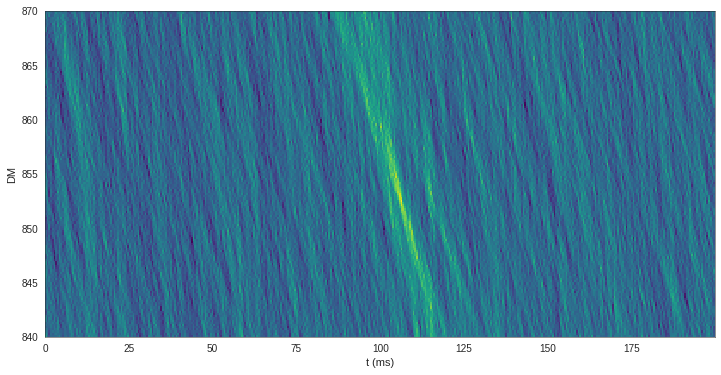

In [38]:
cmap = 'viridis'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

tClipLow = 100. # (start) ms
tClipHigh = 200. # (width) ms
plt.imshow(np.flipud(dmSpaceArr[:,int((tClipLow/1000.)/tInt):int(((tClipLow+tClipHigh)/1000.)/tInt)]),\
           aspect='auto',\
           extent=(0, 1000.*tInt*int((tClipHigh/1000.)/tInt), minDM, maxDM),\
           cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.ylabel('DM')
plt.xlabel('t (ms)')
#plt.colorbar(fraction=0.025)

In [39]:
# Low-res
timeFactor = 8 # time decimation factor

start_time = 3.5 # seconds
time_window = 3 # seconds

minDM = -1000
maxDM = 1000
dmStep = 4

rfi = [[45,65], [155,175], [200,250], [850,1023]] # frequency channels to flag as rfi, pairs are the edges of bands

In [40]:
dmSpaceArrLow, tInt, freqs = frbutils.dmSpace(frbFil, start_time, time_window,
                                          minDM, maxDM, dmStep, timeFactor, rfi=rfi)

Maximum delay (ms) based on maximum DM (1000.000000): 1310.80358783


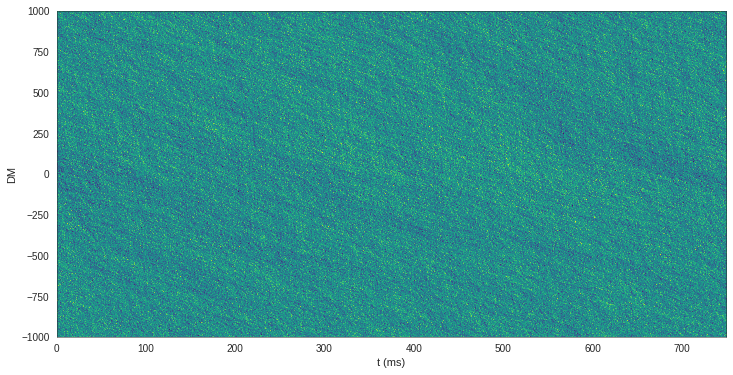

In [41]:
cmap = 'viridis'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

tClipLow = 0. # (start) ms
tClipHigh = 750. # (width) ms
plt.imshow(np.flipud(dmSpaceArrLow[:,int((tClipLow/1000.)/tInt):int(((tClipLow+tClipHigh)/1000.)/tInt)]),\
           aspect='auto',\
           extent=(0, 1000.*tInt*int((tClipHigh/1000.)/tInt), minDM, maxDM),\
           cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.ylabel('DM')
plt.xlabel('t (ms)')
#plt.colorbar(fraction=0.025)

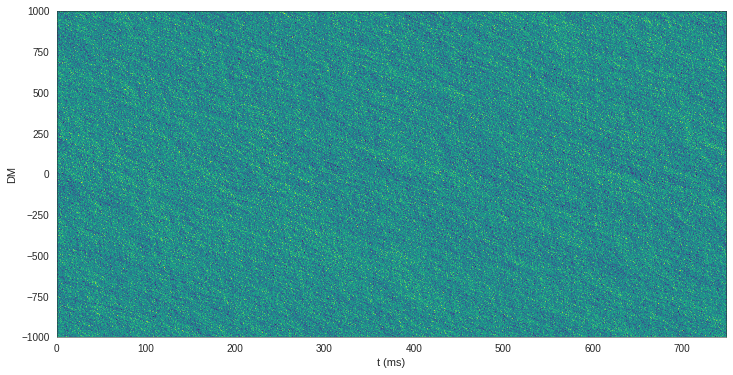

In [42]:
cmap = 'viridis'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

tClipLow = 750. # (start) ms
tClipHigh = 750. # (width) ms
plt.imshow(np.flipud(dmSpaceArrLow[:,int((tClipLow/1000.)/tInt):int(((tClipLow+tClipHigh)/1000.)/tInt)]),\
           aspect='auto',\
           extent=(0, 1000.*tInt*int((tClipHigh/1000.)/tInt), minDM, maxDM),\
           cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.ylabel('DM')
plt.xlabel('t (ms)')
#plt.colorbar(fraction=0.025)

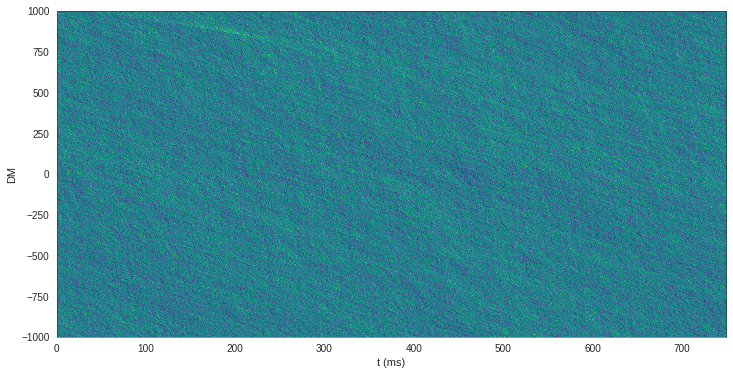

In [43]:
cmap = 'viridis'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

tClipLow = 1500. # (start) ms
tClipHigh = 750. # (width) ms
plt.imshow(np.flipud(dmSpaceArrLow[:,int((tClipLow/1000.)/tInt):int(((tClipLow+tClipHigh)/1000.)/tInt)]),\
           aspect='auto',\
           extent=(0, 1000.*tInt*int((tClipHigh/1000.)/tInt), minDM, maxDM),\
           cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.ylabel('DM')
plt.xlabel('t (ms)')
#plt.colorbar(fraction=0.025)

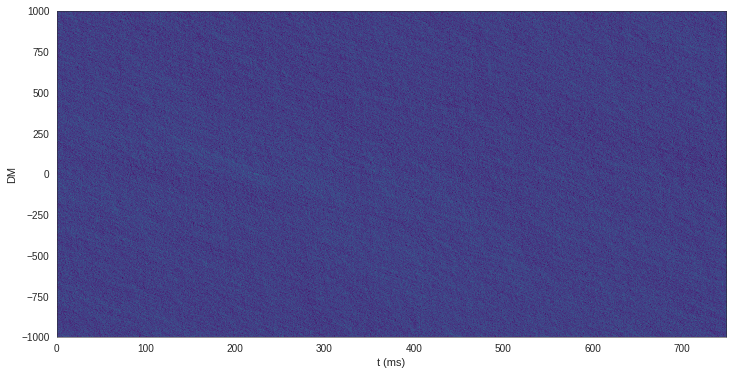

In [44]:
cmap = 'viridis'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

tClipLow = 2250. # (start) ms
tClipHigh = 750. # (width) ms
plt.imshow(np.flipud(dmSpaceArrLow[:,int((tClipLow/1000.)/tInt):int(((tClipLow+tClipHigh)/1000.)/tInt)]),\
           aspect='auto',\
           extent=(0, 1000.*tInt*int((tClipHigh/1000.)/tInt), minDM, maxDM),\
           cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.ylabel('DM')
plt.xlabel('t (ms)')
#plt.colorbar(fraction=0.025)

In [45]:
# No other bright regions in the DM trial space
# No obvious bias in positive or negative DM trial
criteria['dmSpace'] = 'POSITIVE'

### Dispersion Relation

In [46]:
### dynamic spectrum parameters
timeFactor = 1 # time decimation factor
freqFactor = 1 # frequency decimation factor
dm = 851.5 # dedispersion

start_time = 5.1 # seconds
time_window = 1.4 # seconds

applyGauss = True # apply a Gaussian filter to the dynamic specturm
fGauss = 4. # frequency bins
tGauss = 8. # time bins

rfi = [[45,65], [155,175], [200,250], [850,1023]] # frequency channels to flag as rfi, pairs are the edges of bands

normalize = False

In [47]:
decwaterfall, decddwaterfall, tInt, freqs = frbutils.dynamicSpectrum(frbFil, start_time, time_window,
                                                timeFactor=timeFactor, freqFactor=freqFactor,
                                                dm=dm,
                                                applyGauss=applyGauss, fGauss=fGauss, tGauss=tGauss,
                                                rfi=rfi)

In [48]:
ddTimeSeries = np.mean(decddwaterfall, axis=1)
startIdx = np.argmax(ddTimeSeries)
startTime = startIdx * tInt # seconds

In [49]:
if normalize:
    meanGain = np.median(decwaterfall, axis=1)
    decwaterfall = decwaterfall / meanGain[:, None]

    meanBP = np.mean(decwaterfall, axis=0)
    decwaterfall = decwaterfall / meanBP[None, :]

884 2447


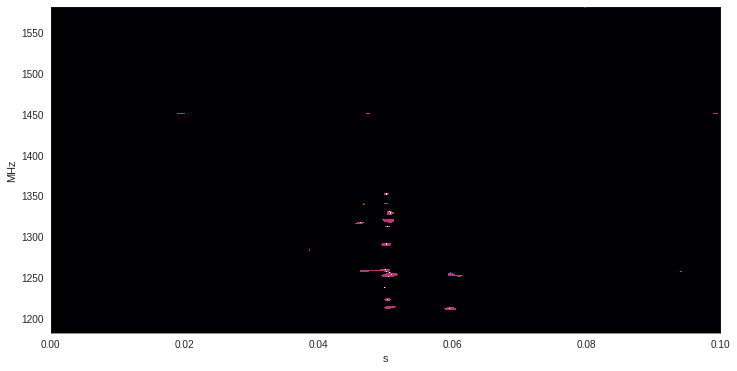

In [50]:
# Find peaks in dedispersed dynamic spectrum
# assuming a near nu^-2 relation, but pick a wide region to allow for variation
peakSearchWidth = .1 # s, time width to find peaks
peakStartTime = startTime - (peakSearchWidth / 2.)
peakStartIdx = int(peakStartTime / tInt)
peakStopTime = startTime + (peakSearchWidth / 2.)
peakStopIdx = int(peakStopTime / tInt)
print peakStartIdx, peakStopIdx

cutoutDynamicSpectrum = np.copy(decddwaterfall[peakStartIdx:peakStopIdx].T)
cutoutDynamicSpectrum -= np.mean(cutoutDynamicSpectrum)

snrThresh = 3.5
stdDSpec = np.std(cutoutDynamicSpectrum)

delays = dedispersion.delay(freqs * 1e6, dm) # seconds
#print delays

binaryMask = np.where(cutoutDynamicSpectrum > snrThresh * stdDSpec, 0.5, 0)

validFidx = []
validTidx = []
validDelays = []
validSNR = []

for fIdx in np.arange(cutoutDynamicSpectrum.shape[0]): # loop over frequency channels
    subband = cutoutDynamicSpectrum[fIdx]
    # select only pixels above a threshold
    subPeakIdx = np.argmax(subband)
    if (subband[subPeakIdx] > snrThresh * stdDSpec) and (freqs[fIdx] < 1400.):
        binaryMask[fIdx, subPeakIdx] = 1.
        validFidx.append(fIdx)
        validTidx.append(subPeakIdx)
        validSNR.append(subband[subPeakIdx] / stdDSpec)

validFreqs = freqs[validFidx]
validDelays = (np.array(validTidx) * tInt) - (peakSearchWidth / 2.) + delays[validFidx] + startTime
validSNR = np.array(validSNR)
#print validFreqs # MHz
#print validDelays # seconds
#print validSNR

cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

imRaw = plt.imshow(np.flipud(binaryMask), extent=(0, tInt*cutoutDynamicSpectrum.shape[1],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.ylabel('MHz')
plt.xlabel('s')

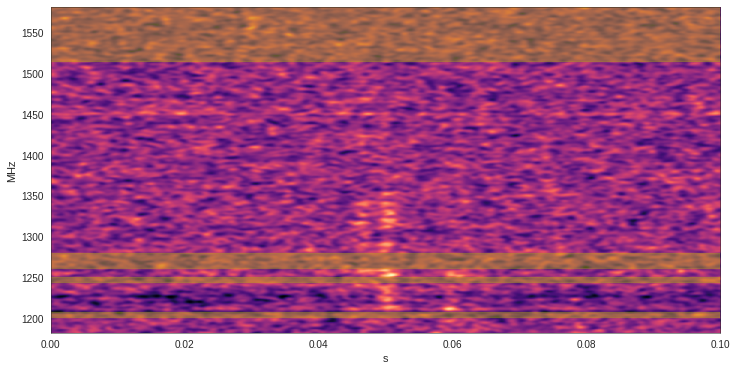

In [51]:
cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

imRaw = plt.imshow(np.flipud(cutoutDynamicSpectrum), extent=(0, tInt*cutoutDynamicSpectrum.shape[1],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')
plt.xlabel('s')

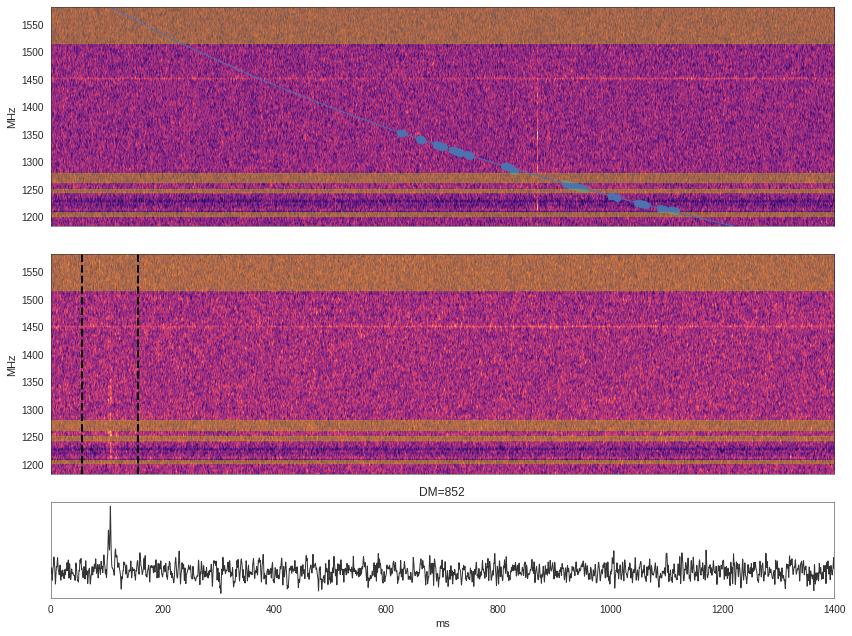

In [52]:
cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,9)) # (width, height)

ax1 = plt.subplot2grid((5, 3), (0, 0), colspan=3, rowspan=2)

imRaw = plt.imshow(np.flipud(decwaterfall.T), extent=(0, tInt*decddwaterfall.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')

plt.plot(((dm * (4.15 * (10.**6) * (freqs**(-2.) - freqs[-1]**(-2.))))/1000.) + startTime, freqs)

plt.scatter(validDelays, validFreqs)

ax1.get_xaxis().set_visible(False)

ax2 = plt.subplot2grid((5, 3), (2, 0), colspan=3, rowspan=2)

imRaw = plt.imshow(np.flipud(decddwaterfall.T), extent=(0, tInt*decddwaterfall.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

plt.axvline(x=peakStartTime, c='k', lw=2, ls='--')
plt.axvline(x=peakStopTime, c='k', lw=2, ls='--')

for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')

ax2.get_xaxis().set_visible(False)

ax3 = plt.subplot2grid((5, 3), (4, 0), colspan=3)
lineColor = 'k'
plt.plot(1000.*tInt*np.arange(decddwaterfall.shape[0]), ddTimeSeries, lineColor, alpha=0.8)
plt.xlim(0, 1000.*tInt*ddTimeSeries.shape[0])
plt.title('DM=%0.f'%dm)
plt.xlabel('ms')
ax3.get_yaxis().set_visible(False)

plt.tight_layout()

#### Build Power Law Model

In [53]:
model = lmfit.models.ExpressionModel('amp * (nu1**(alpha) - nu2**(alpha)) - toff', independent_vars=['nu1', 'nu2'])

print model
print model.param_names
print model.independent_vars

<lmfit.ExpressionModel('amp * (nu1**(alpha) - nu2**(alpha)) - toff')>
['amp', 'alpha', 'toff']
['nu1', 'nu2']


In [54]:
nu1 = validFreqs.copy()
nu2 = np.ones_like(validFreqs) * freqs[-1]

In [55]:
params = model.make_params(amp=dm * 4.148808e3, alpha=-2., toff=-1.*startTime)
#params['alpha'].set(min=-2.5, max=-1.5)
print params

Parameters([('amp', <Parameter 'amp', 3532710.012, bounds=[-inf:inf]>), ('alpha', <Parameter 'alpha', -2.0, bounds=[-inf:inf]>), ('toff', <Parameter 'toff', -0.106624, bounds=[-inf:inf]>)])


In [56]:
#print model.eval(params, nu1=nu1, nu2=nu2)
#print validDelays

In [57]:
out  = model.fit(validDelays, params, nu1=nu1, nu2=nu2, weights=validSNR)
print out.fit_report()

[[Model]]
    Model(_eval)
[[Fit Statistics]]
    # function evals   = 2785
    # data points      = 120
    # variables        = 3
    chi-square         = 0.015
    reduced chi-square = 0.000
    Akaike info crit   = -1070.663
    Bayesian info crit = -1062.301
[[Variables]]
    amp:     6.3786e+08 +/- 4.95e+08 (77.60%) (init= 3532710)
    alpha:  -2.77089820 +/- 0.114519 (4.13%) (init=-2)
    toff:   -0.15402169 +/- 0.007902 (5.13%) (init=-0.106624)
[[Correlations]] (unreported correlations are <  0.100)
    C(amp, alpha)                = -1.000 
    C(alpha, toff)               =  0.989 
    C(amp, toff)                 = -0.988 



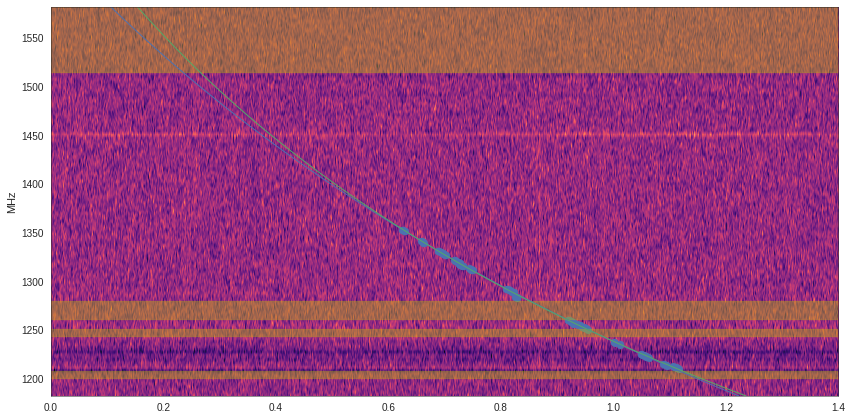

In [58]:
alphaBest = out.best_values['alpha']
ampBest = out.best_values['amp']
toffBest = out.best_values['toff']
nu1Full = freqs
nu2Full = freqs[-1]

cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

imRaw = plt.imshow(np.flipud(decwaterfall.T), extent=(0, tInt*decddwaterfall.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

for rfiPair in rfi:
    plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
plt.ylabel('MHz')

plt.plot(((dm * (4.15 * (10.**6) * (freqs**(-2.) - freqs[-1]**(-2.))))/1000.) + startTime, freqs)
plt.plot(ampBest * (nu1Full**(alphaBest) - nu2Full**(alphaBest)) - toffBest, freqs)


plt.scatter(validDelays, validFreqs)

plt.tight_layout()

In [59]:
# The pulse is not wide enough in frequency to do a reasonable dispersion relation fit
criteria['dispersionRelation'] = 'NEUTRAL'

### Telescope Response

In [61]:
offFrbFil = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b13.fil' # beam 13, same time

onFil = filterbankio.Filterbank(frbFil)
ontInt = onFil.header['tsamp'] # get tInt
onFreqsHz = onFil.freqs * 1e6 # generate array of freqs in Hz
onFreqs = onFreqsHz / 1e6 # MHz
onWaterfall = np.reshape(onFil.data, (onFil.data.shape[0], onFil.data.shape[2]))

offFil = filterbankio.Filterbank(offFrbFil)
offtInt = offFil.header['tsamp'] # get tInt
offFreqsHz = offFil.freqs * 1e6 # generate array of freqs in Hz
offWaterfall = np.reshape(offFil.data, (offFil.data.shape[0], offFil.data.shape[2]))

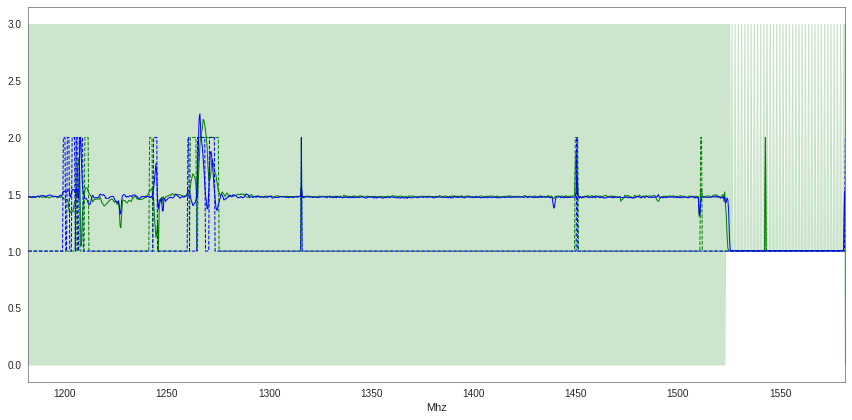

In [62]:
# Bandpass

onMeanBP = onWaterfall.mean(axis=0)
onMinBP = onWaterfall.min(axis=0)
onMaxBP = onWaterfall.max(axis=0)
onMedianBP = np.median(onWaterfall, axis=0)

offMeanBP = offWaterfall.mean(axis=0)
offMinBP = offWaterfall.min(axis=0)
offMaxBP = offWaterfall.max(axis=0)
offMedianBP = np.median(offWaterfall, axis=0)

cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

plt.plot(onFreqs, onMeanBP, 'g-')
plt.plot(onFreqs, onMedianBP, 'g--')
#plt.plot(onFreqs, onMinBP, 'g.')
#plt.plot(onFreqs, onMaxBP, 'g.-')
plt.fill_between(onFreqs, onMinBP, onMaxBP, color='g', alpha=0.2)

plt.plot(onFreqs, offMeanBP, 'b-')
plt.plot(onFreqs, offMedianBP, 'b--')
#plt.plot(onFreqs, offMinBP, 'b.')
#plt.plot(onFreqs, offMaxBP, 'b.-')

plt.xlim(onFreqs[0], onFreqs[-1])
plt.xlabel('Mhz')

plt.tight_layout()

In [63]:
criteria['bandpass'] = 'UNKNOWN' # data has been bandpass normalized

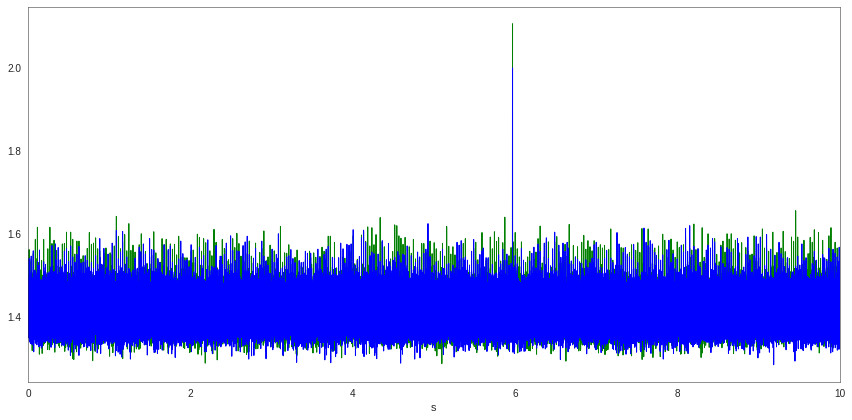

In [64]:
# Gain

onMeanGain = onWaterfall.mean(axis=1)
onMinGain = onWaterfall.min(axis=1)
onMaxGain = onWaterfall.max(axis=1)
onMedianGain = np.median(onWaterfall, axis=1)

offMeanGain = offWaterfall.mean(axis=1)
offMinGain = offWaterfall.min(axis=1)
offMaxGain = offWaterfall.max(axis=1)
offMedianGain = np.median(offWaterfall, axis=1)

tRange = np.arange(onMeanGain.shape[0]) * ontInt

cmap = 'magma'
sns.set_style('white', rc={'axes.linewidth': 0.5})

fig = plt.figure(figsize=(12,6)) # (width, height)

plt.plot(tRange, onMeanGain, 'g-')
#plt.plot(onFreqs, onMedianGain, 'g--')
#plt.plot(onFreqs, onMinGain, 'g.')
#plt.plot(onFreqs, onMaxGain, 'g.-')
#plt.fill_between(onFreqs, onMinGain, onMaxGain, color='g', alpha=0.2)

plt.plot(tRange, offMeanGain, 'b-')
#plt.plot(onFreqs, offMedianGain, 'b--')
#plt.plot(onFreqs, offMinGain, 'b.')
#plt.plot(onFreqs, offMaxGain, 'b.-')

plt.xlim(0, onMeanGain.shape[0] * ontInt)
plt.xlabel('s')

plt.tight_layout()

In [65]:
criteria['gain'] = 'UNKNOWN' # data has been gain normalized

### Telescope State

In [66]:
# Telescope pointing

eventUTCStr = '2013-07-29 09:01:51.190'
eventUTC = astropy.time.Time(eventUTCStr)
print eventUTC

eventGalb = 54.7446
eventGall = 324.788

galCoords = astropy.coordinates.SkyCoord(eventGall, eventGalb, frame=astropy.coordinates.Galactic,\
                                         unit='deg', equinox='J2000')
print galCoords

# Parkes location
# https://www.parkes.atnf.csiro.au/observing/documentation/user_guide/pks_ug_2.html
siteLat = -32.99778
siteLong = 148.26292
siteLoc = astropy.coordinates.EarthLocation(lat=siteLat * astropy.units.deg, lon=siteLong * astropy.units.deg,\
                                  height=414.80 * astropy.units.m)
print siteLoc

print galCoords.transform_to(astropy.coordinates.AltAz(obstime=eventUTC, location=siteLoc))

print galCoords.transform_to('icrs')

2013-07-29 09:01:51.190
<SkyCoord (Galactic): (l, b) in deg
    ( 324.788,  54.7446)>
(-4554234.701509818, 2816825.9185967753, -3453978.054094455) m
<SkyCoord (AltAz: obstime=2013-07-29 09:01:51.190, location=(-4554234.701509818, 2816825.9185967753, -3453978.054094455) m, pressure=0.0 hPa, temperature=0.0 deg_C, relative_humidity=0, obswl=1.0 micron): (az, alt) in deg
    ( 313.21889382,  54.19034461)>
<SkyCoord (ICRS): (ra, dec) in deg
    ( 205.33766462, -5.99519398)>


In [67]:
criteria['lowAltitude'] = 'POSITIVE' # high-altitude pointing, 54 deg

In [68]:
#criteria['sysNoise'] = 'UNKNOWN' # system noise nominal?
#criteria['correctFeed'] = 'UNKNOWN' # was the feed in the corrct position?
#criteria['obsLog'] = 'UNKNOWN' # was the observation log checked to be nominal?
#criteria['electronics'] = 'UNKNOWN' # were the correct electornics on? were other systems off?
criteria['telState'] = 'UNKNOWN'
criteria['rfi'] = 'UNKNOWN'

### Follow-Up Observations

In [69]:
# Unknown if follow-up observations or a pulsar search were done
criteria['repeats'] = 'UNKNOWN'
criteria['lowSNRsearch'] = 'UNKNOWN'

### Multi-Beam

In [70]:
# dynamic spectrum parameters
timeFactor = 1 # time decimation factor
freqFactor = 1 # frequency decimation factor
dm = 851.5 # dedispersion

start_time = 5.1 # seconds
time_window = 0.2 # seconds

applyGauss = True # apply a Gaussian filter to the dynamic specturm
fGauss = 4. # frequency bins
tGauss = 8. # time bins

rfi = [[45,70], [155,175], [200,250], [840,1023]] # frequency channels to flag as rfi, pairs are the edges of bands

In [71]:
def multiBeamPlot():
    decwaterfallBeam, decddwaterfallBeam, tInt, freqs = frbutils.dynamicSpectrum(frbFilBeam,
                                          start_time, time_window,
                                          timeFactor=timeFactor, freqFactor=freqFactor,
                                          dm=dm,
                                          applyGauss=applyGauss, fGauss=fGauss, tGauss=tGauss,
                                          rfi=rfi)

    ddTimeSeriesBeam = np.mean(decddwaterfallBeam, axis=1)

    cmap = 'magma'
    sns.set_style('white', rc={'axes.linewidth': 0.5})

    fig = plt.figure(figsize=(12,6)) # (width, height)

    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=3, rowspan=2)

    imRaw = plt.imshow(np.flipud(decddwaterfallBeam.T), extent=(0, tInt*decddwaterfallBeam.shape[0],\
                        freqs[0], freqs[-1]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')
    # crop out RFI flagged high freqs
    #imRaw = plt.imshow(np.flipud(decddwaterfallBeam[:,:850].T), extent=(0, tInt*decddwaterfallBeam.shape[0],\
    #                    freqs[0], freqs[850]), aspect='auto', cmap=plt.get_cmap(cmap), interpolation='nearest')

    for rfiPair in rfi:
        plt.axhspan(freqs[rfiPair[0]/freqFactor], freqs[rfiPair[1]/freqFactor], alpha=0.4, color='y')
    plt.ylabel('MHz')

    ax1.get_xaxis().set_visible(False)

    ax2 = plt.subplot2grid((3, 3), (2, 0), colspan=3)
    lineColor = 'k'
    plt.plot(1000.*tInt*np.arange(decddwaterfallBeam.shape[0]), ddTimeSeriesBeam, lineColor, alpha=0.8)
    plt.plot(1000.*tInt*np.arange(decddwaterfall.shape[0]), ddTimeSeries, 'r', alpha=0.4) # pulse time series
    plt.xlim(0, 1000.*tInt*ddTimeSeriesBeam.shape[0])
    plt.title('DM=%0.f'%dm)
    plt.xlabel('ms')
    ax2.get_yaxis().set_visible(False)

    plt.tight_layout()

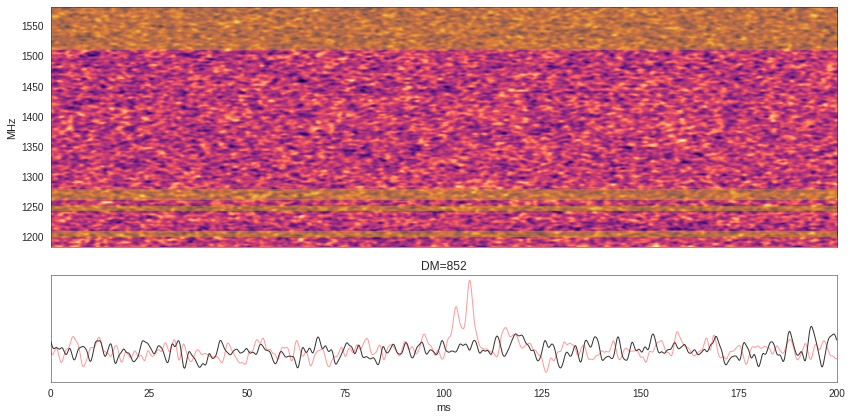

In [73]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b01.fil' # beam 01 (watermark)
multiBeamPlot()

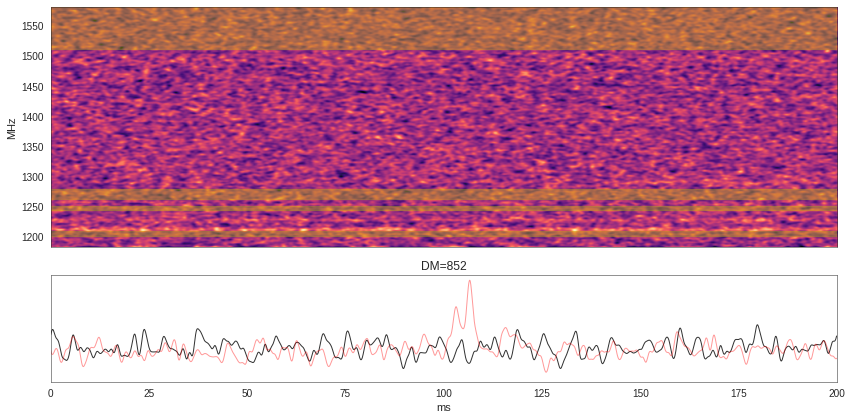

In [74]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b02.fil' # beam 02 (watermark)
multiBeamPlot()

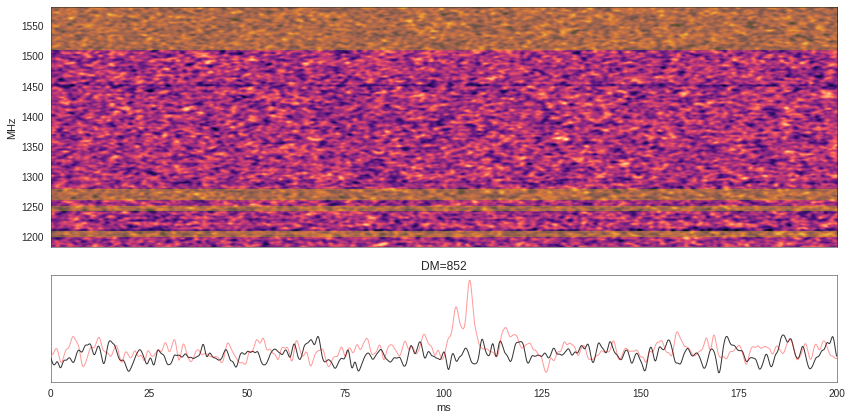

In [75]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b03.fil' # beam 03 (watermark)
multiBeamPlot()

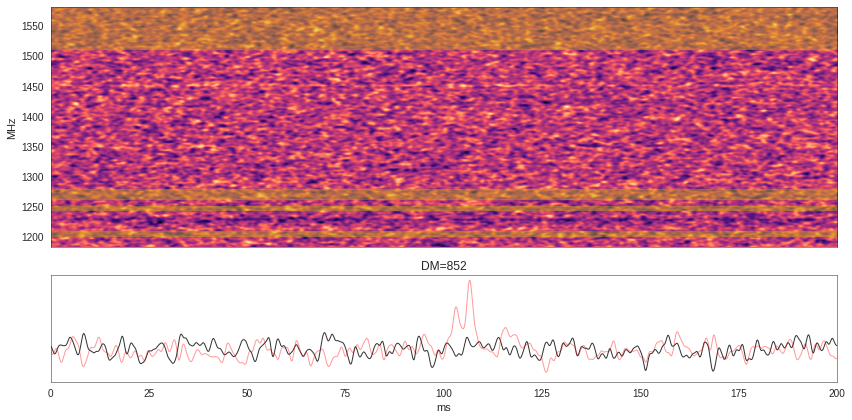

In [76]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b04.fil' # beam 04 (watermark)
multiBeamPlot()

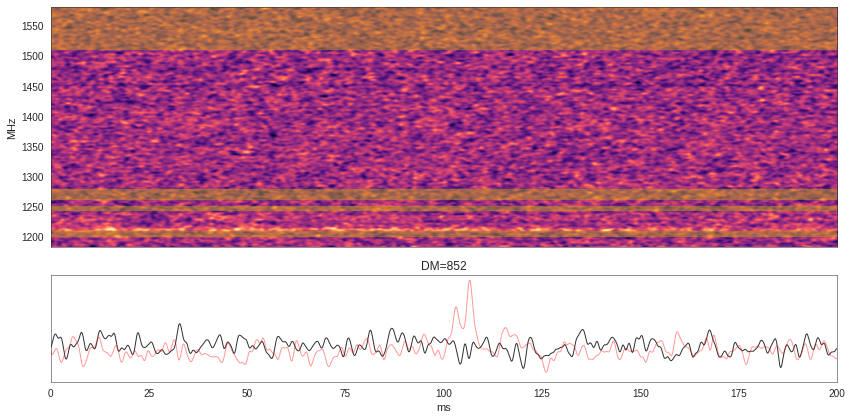

In [77]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b05.fil' # beam 05 (watermark)
multiBeamPlot()

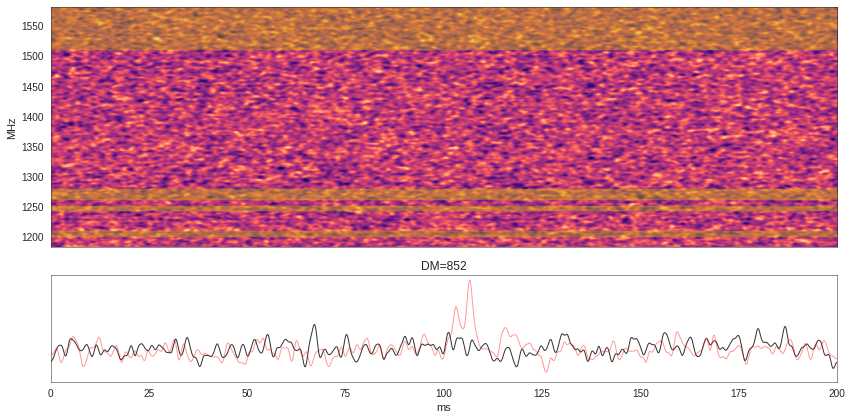

In [78]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b06.fil' # beam 06 (watermark)
multiBeamPlot()

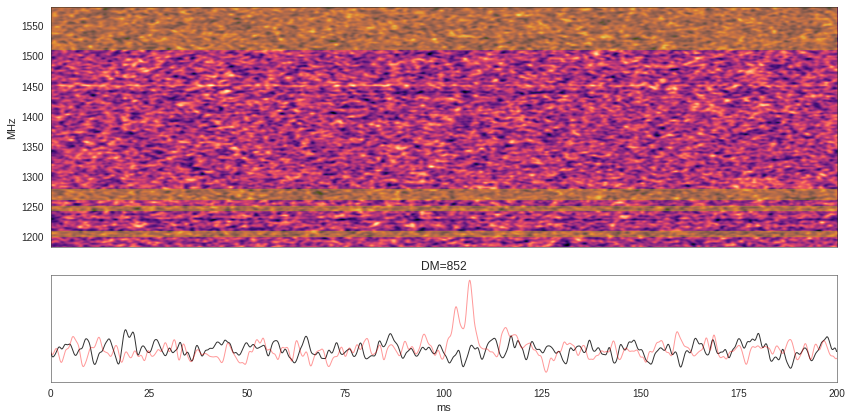

In [79]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b07.fil' # beam 07 (watermark)
multiBeamPlot()

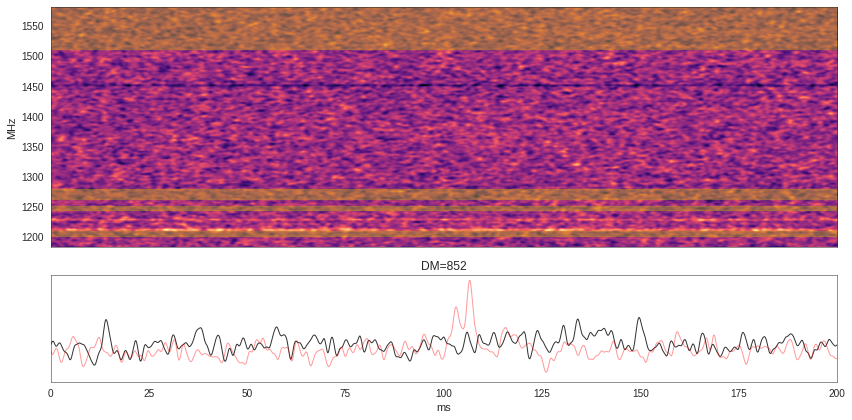

In [80]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b08.fil' # beam 08 (watermark)
multiBeamPlot()

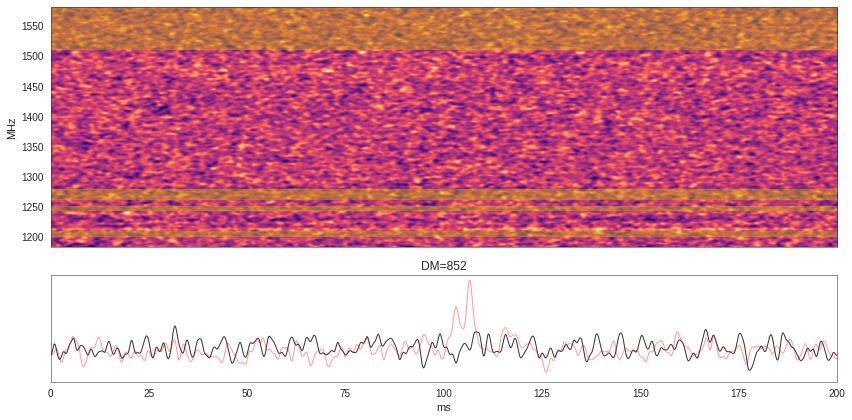

In [81]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b09.fil' # beam 09 (watermark)
multiBeamPlot()

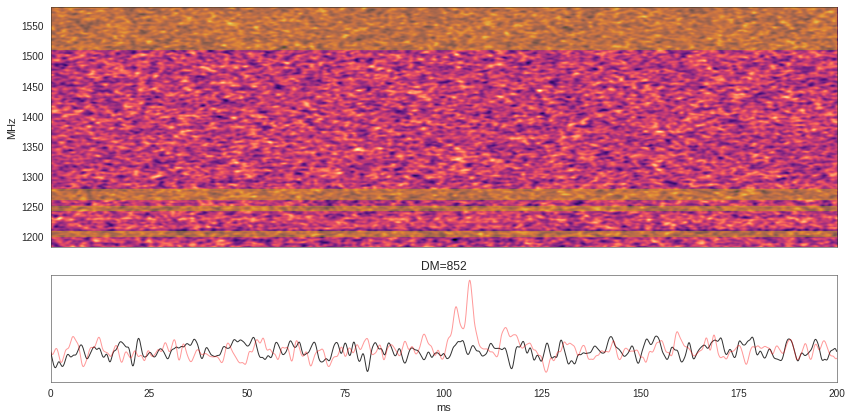

In [82]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b11.fil' # beam 11 (watermark)
multiBeamPlot()

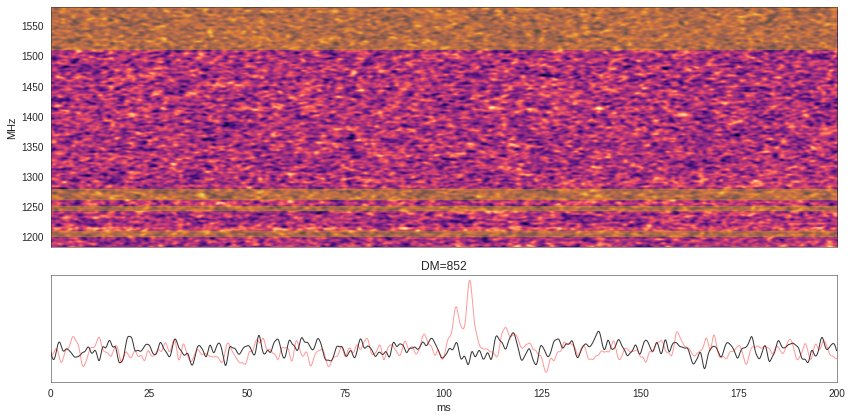

In [83]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b12.fil' # beam 12 (watermark)
multiBeamPlot()

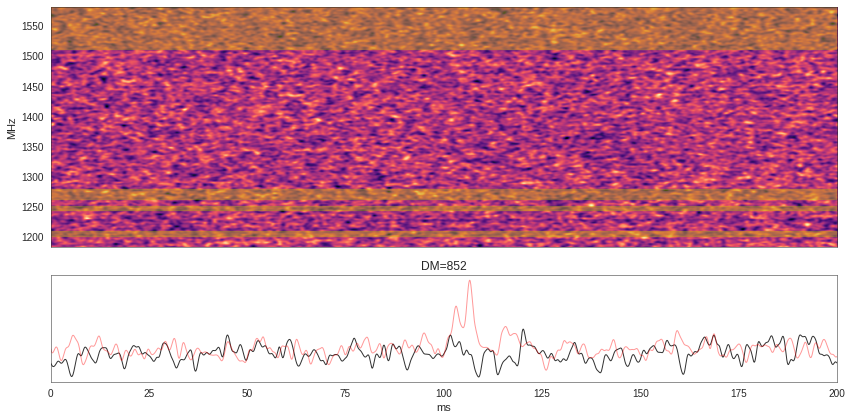

In [84]:
frbFilBeam = '/home/griffin/data/FRB/FRB130729/FRB130729_s41r10b8_b13.fil' # beam 13 (watermark)
multiBeamPlot()

In [85]:
# No pulse present in any of the other beams
criteria['multiBeam'] = 'POSITIVE'

### Tied-Array Beam

In [86]:
criteria['TAB'] = 'NOTVALID'

### Interferometric Observations

In [87]:
criteria['interferometric'] = 'NOTVALID'

### Multi-Site

In [88]:
criteria['multiSite'] = 'NOTVALID'

### Available Data

In [89]:
criteria['dataSingleBeam'] = 'NOTVALID'
criteria['dataMultiBeam'] = 'NEUTRAL'
criteria['dataTAB'] = 'NOTVALID'
criteria['dataInterferometric'] = 'NOTVALID'
criteria['dataMultiSite'] = 'NOTVALID'
criteria['dataVoltages'] = 'NOTVALID'

### Report Output

In [90]:
for key in criteria.iterkeys():
    print '%s: %s'%(key, criteria[key])

outFn = 'criteria.%s.pkl'%frbStr
ofh = open(outFn, 'wb')
pkl.dump(criteria, ofh)
ofh.close()

dataInterferometric: NOTVALID
multiSite: NOTVALID
multicomp: NEUTRAL
lowAltitude: POSITIVE
scattering: NEUTRAL
spectralIndex: NEGATIVE
flux: POSITIVE
broadband: NEGATIVE
multiBeam: POSITIVE
polarization: NOTVALID
pulsewidth: POSITIVE
DMexcess: POSITIVE
TAB: NOTVALID
dispersionRelation: NEUTRAL
telState: UNKNOWN
interferometric: NOTVALID
gain: UNKNOWN
dataVoltages: NOTVALID
dataMultiBeam: NEUTRAL
dataTAB: NOTVALID
dmSpace: POSITIVE
lowSNRsearch: UNKNOWN
dataMultiSite: NOTVALID
highResStruct: NEUTRAL
SNR: POSITIVE
rfi: UNKNOWN
repeats: UNKNOWN
scintillation: NEUTRAL
bandpass: UNKNOWN
dataSingleBeam: NOTVALID
